# DBSCAN SNN

> Réalisé par : Mohamed ELFILALI

## Partie DBSCAN

On import les dépendances ainsi que le dataSet

In [2]:
from sklearn import cluster
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.datasets.samples_generator import make_blobs

data = np.genfromtxt("cham-data/t4.8k.dat",delimiter=" ")

On crée une méthode qui prend en entré le dataSet ainsi que d'autre paramètres

In [3]:
def meth_dbscan(dataSet,Scores,met='euclidean',minSamples = 18,distance = 10):
    clustering = cluster.DBSCAN(eps=distance,min_samples=minSamples,metric=met).fit(dataSet)
    labels = clustering.labels_

    score = metrics.silhouette_score(dataSet, labels)
    
    Scores.append(score)
    
    print("Silhouette Coefficient: %0.3f" % score)
    
    core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
    core_samples_mask[clustering.core_sample_indices_] = True
    
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = dataSet[class_member_mask & core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=5)

        xy = dataSet[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=2)

    plt.title('Avec un eps='+str(distance)+' , min_samples='+str(minSamples)+' et metric='+met+' le Nombre de clusters:'+str(n_clusters_))
    plt.show()

On teste plusieurs valeur pour la distance (eps) et on obtient le résultat suivant

Silhouette Coefficient: -0.596


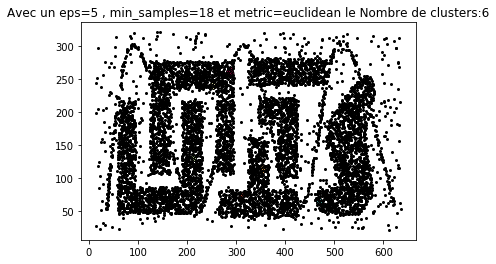

Silhouette Coefficient: -0.527


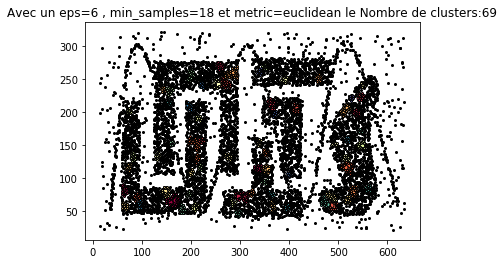

Silhouette Coefficient: -0.105


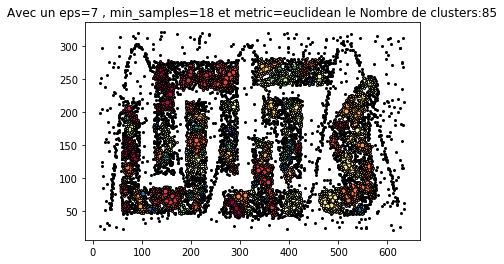

Silhouette Coefficient: -0.106


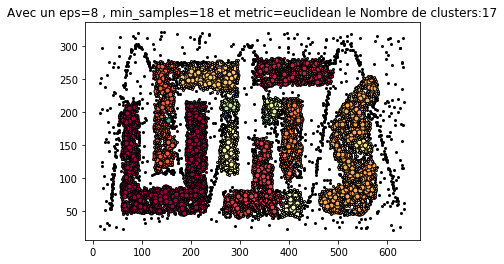

Silhouette Coefficient: 0.237


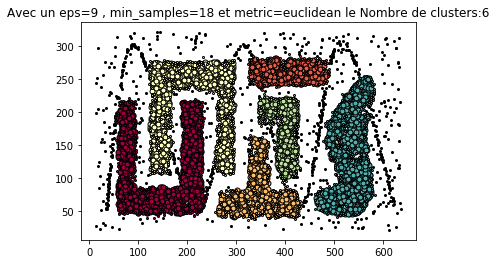

Silhouette Coefficient: 0.246


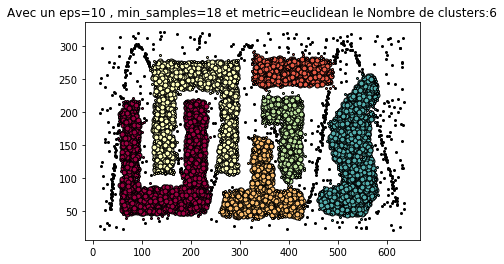

Silhouette Coefficient: 0.199


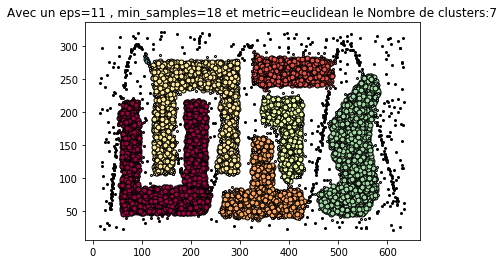

Silhouette Coefficient: 0.105


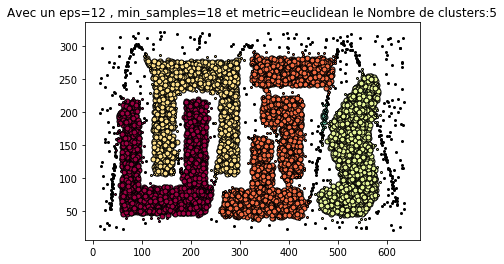

Silhouette Coefficient: 0.199


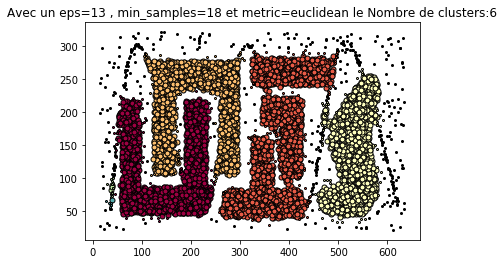

Silhouette Coefficient: 0.305


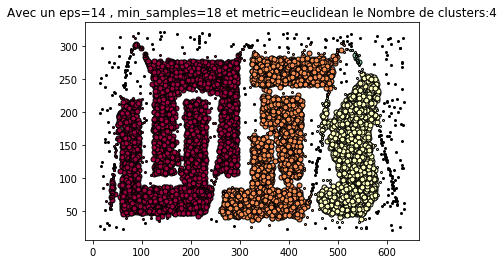

Silhouette Coefficient: 0.277


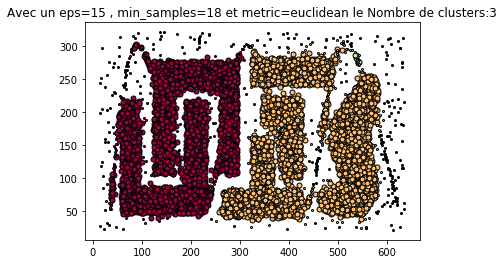

Silhouette Coefficient: 0.283


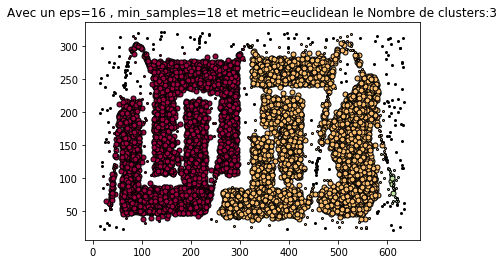

Silhouette Coefficient: 0.287


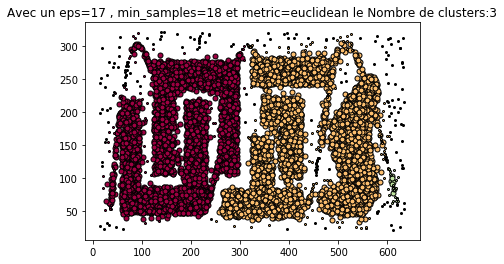

Silhouette Coefficient: 0.092


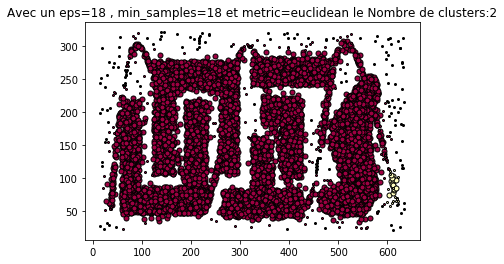

Silhouette Coefficient: 0.272


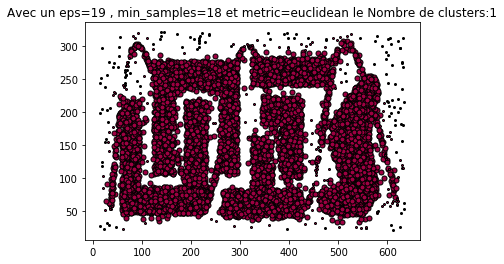

Silhouette Coefficient: 0.277


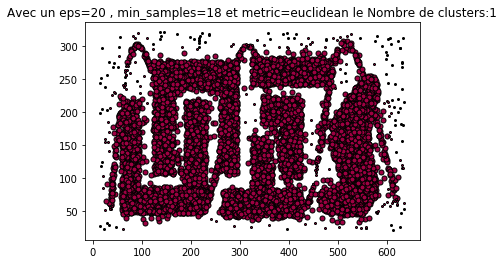

Silhouette Coefficient: 0.285


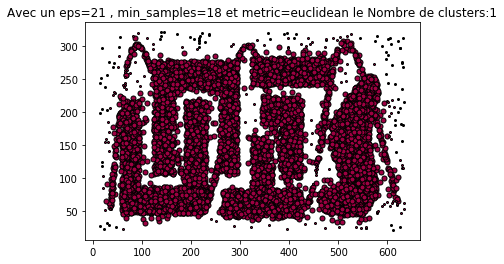

Silhouette Coefficient: 0.291


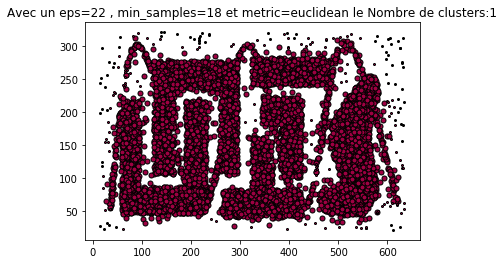

Silhouette Coefficient: 0.316


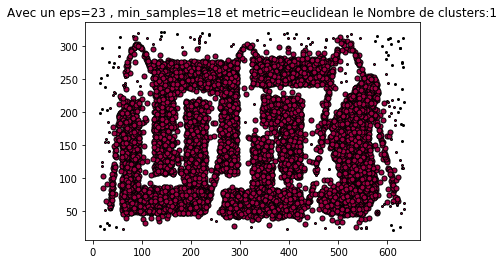

Silhouette Coefficient: 0.323


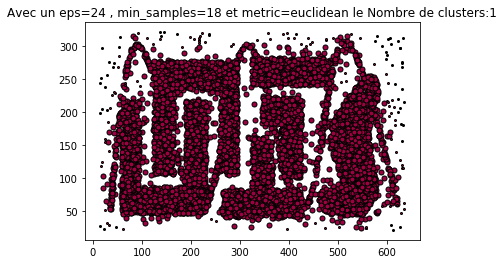

Silhouette Coefficient: 0.325


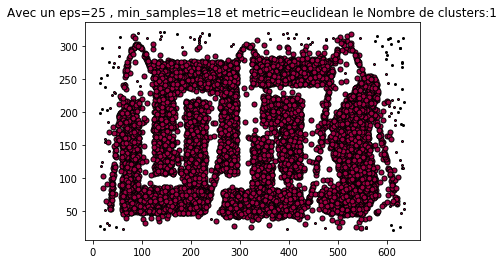

Silhouette Coefficient: 0.311


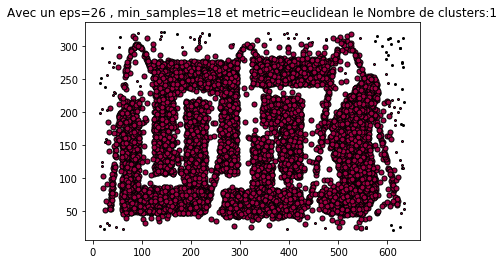

Silhouette Coefficient: 0.303


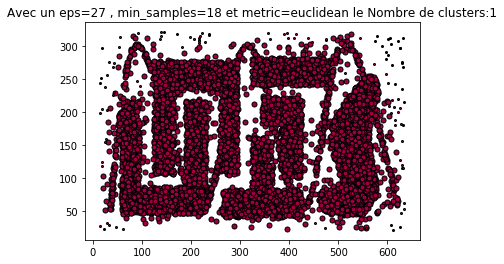

Silhouette Coefficient: 0.309


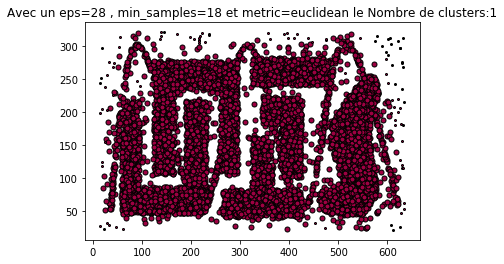

Silhouette Coefficient: 0.307


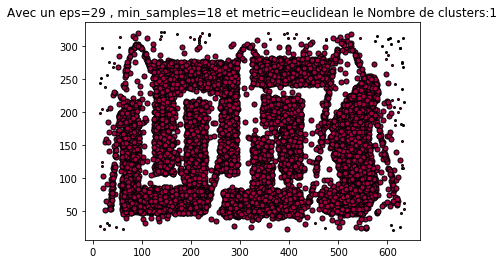

In [4]:
Scores = []

for i in range(5,30):
    meth_dbscan(dataSet=data,distance=i,Scores = Scores)

Pour les valeurs 9 et 10 comme distance on a eu un meilleur nombre de clusters mais pour une distance 10 on a un meilleur score

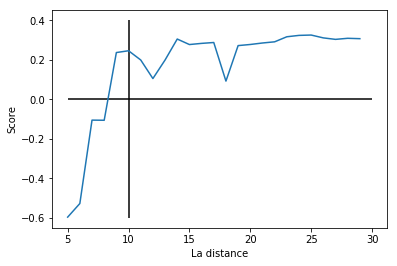

In [5]:
plt.plot(range(5,30),Scores)
plt.hlines(y=0,xmin=5, xmax=30)
plt.vlines(x=10,ymin=-0.6,ymax=0.4)
plt.xlabel('La distance')
plt.ylabel('Score')
plt.show()

On teste plusieurs valeur pour le minSamples et on obtient le résultat suivant

Silhouette Coefficient: -0.295


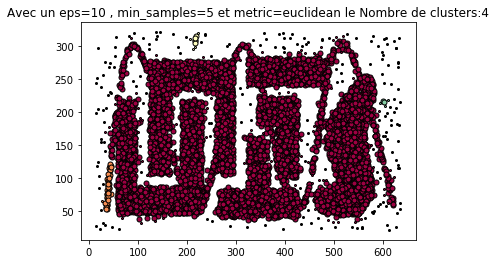

Silhouette Coefficient: -0.156


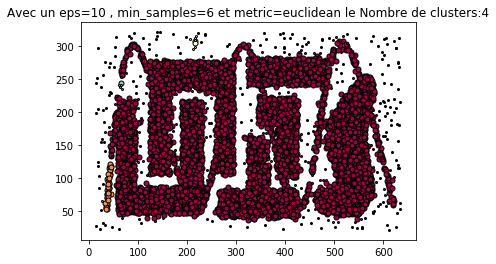

Silhouette Coefficient: -0.219


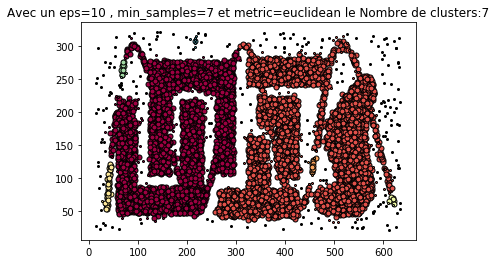

Silhouette Coefficient: -0.194


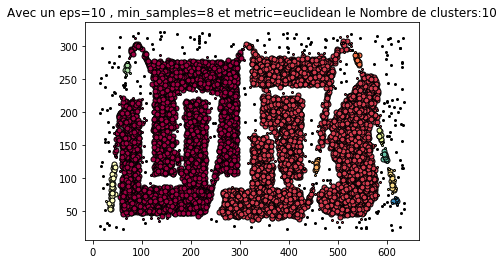

Silhouette Coefficient: -0.272


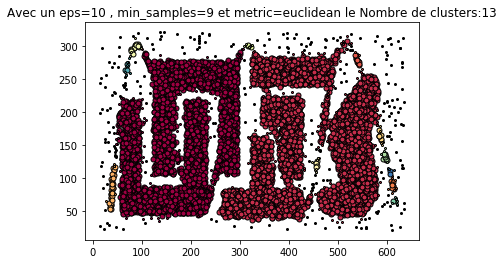

Silhouette Coefficient: -0.158


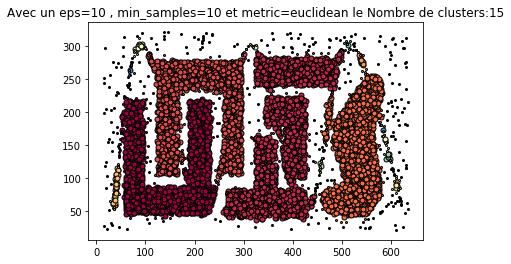

Silhouette Coefficient: -0.115


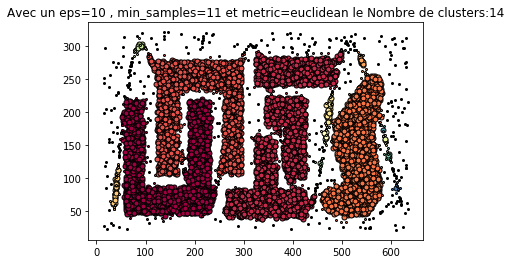

Silhouette Coefficient: -0.047


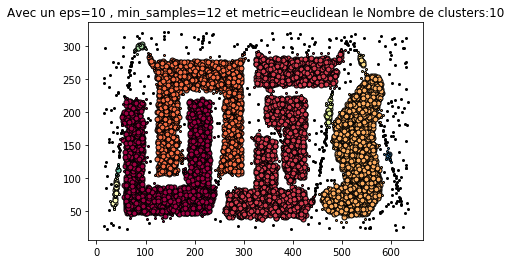

Silhouette Coefficient: 0.062


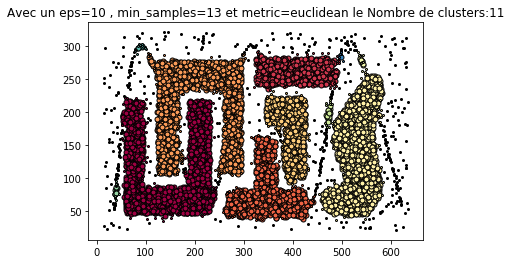

Silhouette Coefficient: 0.058


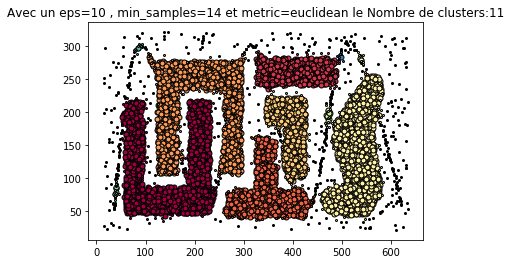

Silhouette Coefficient: 0.129


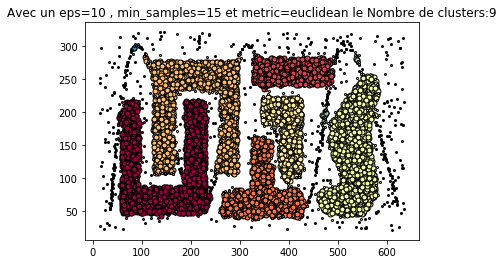

Silhouette Coefficient: 0.103


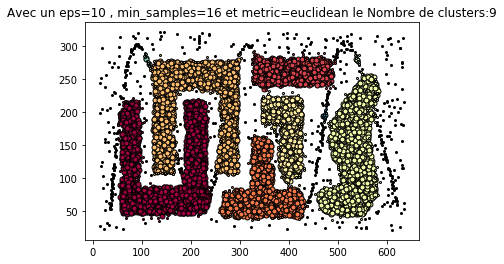

Silhouette Coefficient: 0.193


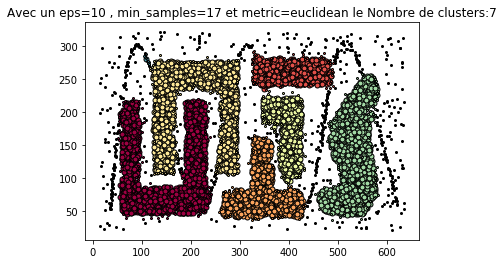

Silhouette Coefficient: 0.246


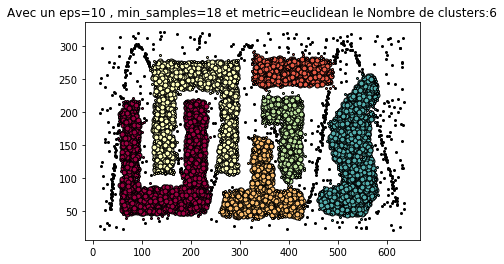

Silhouette Coefficient: 0.244


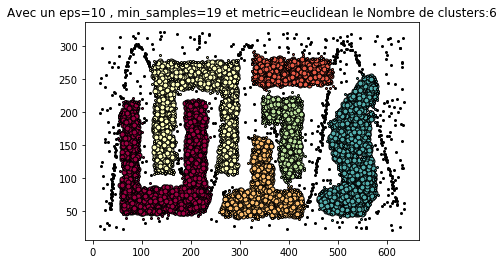

Silhouette Coefficient: 0.243


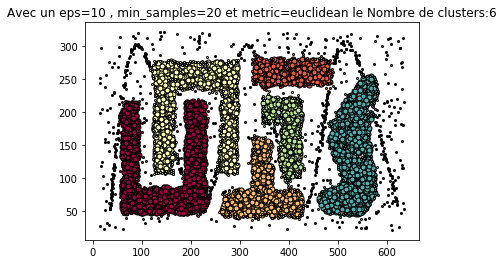

Silhouette Coefficient: 0.241


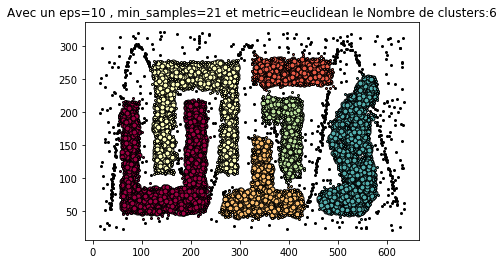

Silhouette Coefficient: 0.238


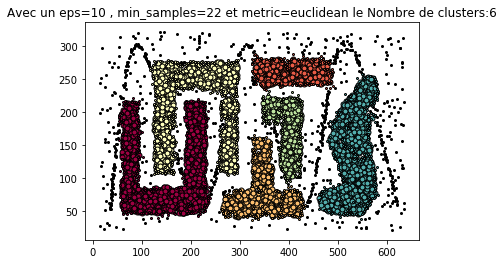

Silhouette Coefficient: 0.235


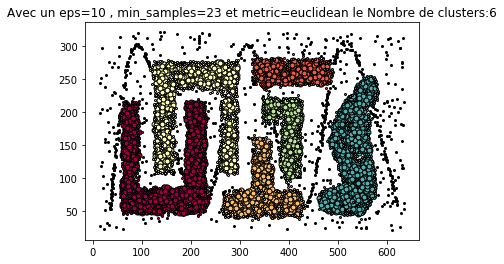

Silhouette Coefficient: 0.223


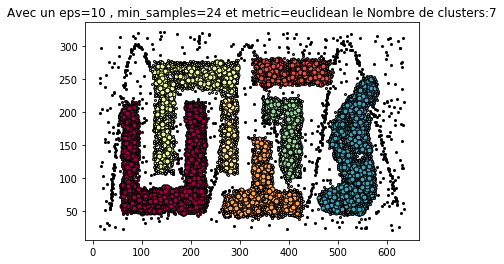

Silhouette Coefficient: 0.168


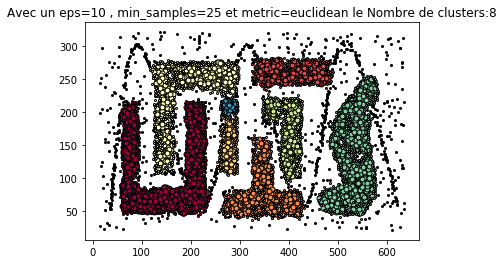

Silhouette Coefficient: 0.115


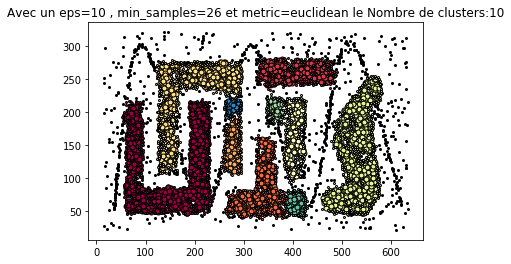

Silhouette Coefficient: 0.125


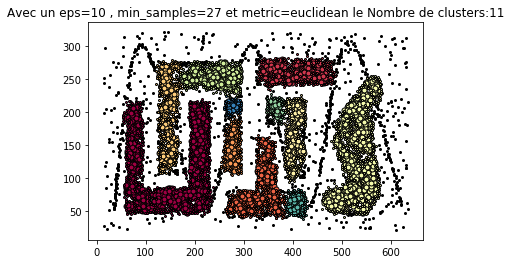

Silhouette Coefficient: 0.114


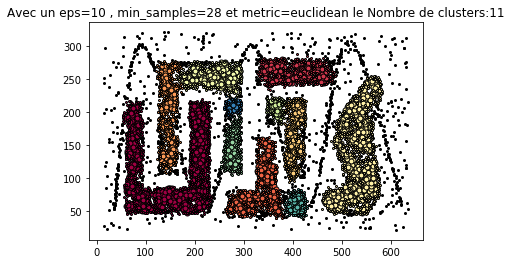

Silhouette Coefficient: 0.118


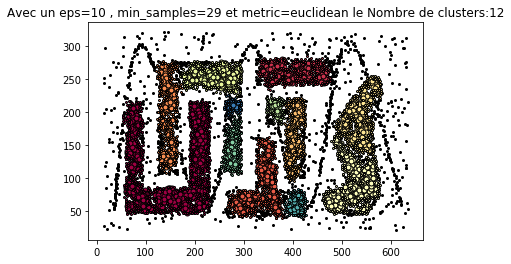

In [6]:
ScoresSamples = []

for i in range(5,30):
    meth_dbscan(dataSet=data,minSamples=i,Scores = ScoresSamples)

Pour les valeurs de 19 jusqu'à 23 comme minSamples on a eu un meilleur nombre de clusters mais pour un minSamples 18 on a un meilleur score

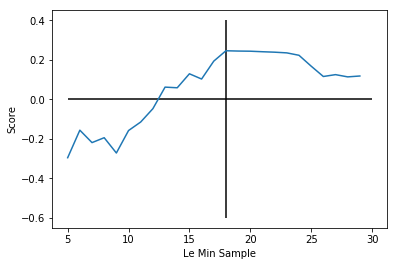

In [7]:
plt.plot(range(5,30),ScoresSamples)
plt.hlines(y=0,xmin=5, xmax=30)
plt.vlines(x=18,ymin=-0.6,ymax=0.4)
plt.xlabel('Le Min Sample')
plt.ylabel('Score')
plt.show()

On réalise les même etapes avec un autre DataSet

Silhouette Coefficient: 0.035


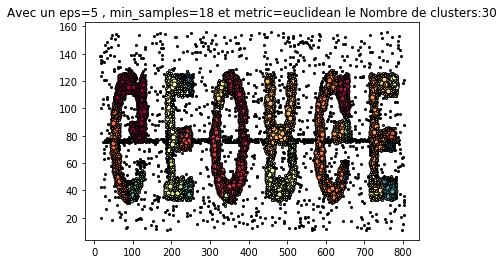

Silhouette Coefficient: 0.296


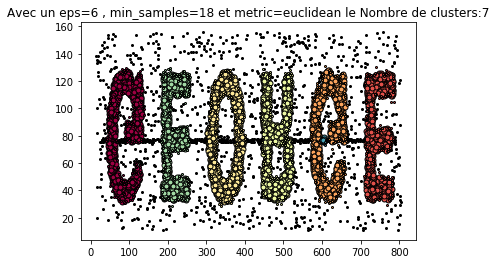

Silhouette Coefficient: 0.440


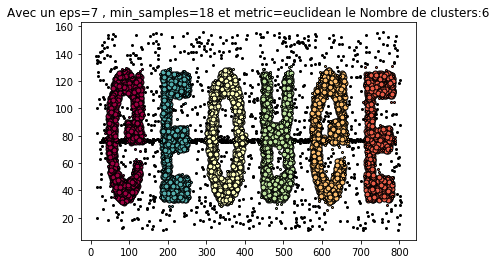

Silhouette Coefficient: 0.293


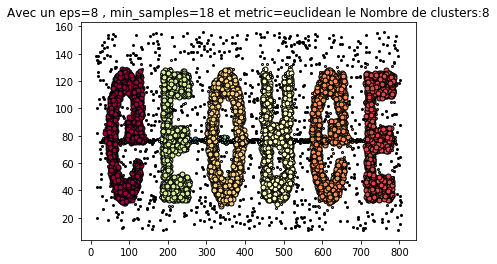

Silhouette Coefficient: 0.210


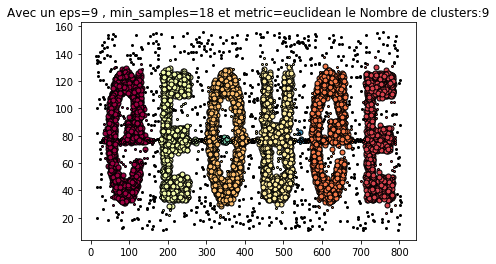

Silhouette Coefficient: 0.421


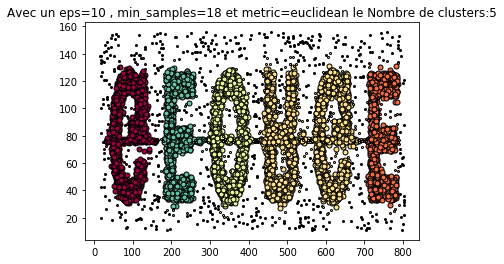

Silhouette Coefficient: 0.217


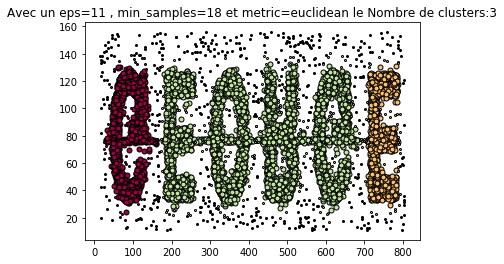

Silhouette Coefficient: 0.176


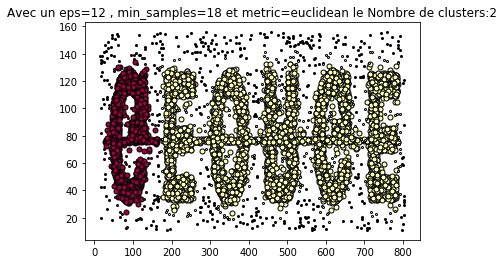

Silhouette Coefficient: 0.028


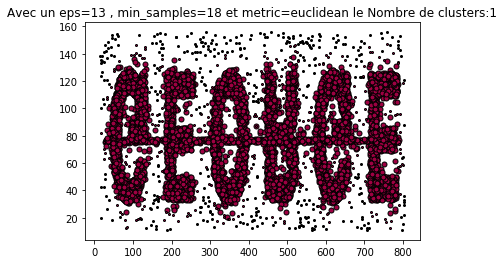

Silhouette Coefficient: 0.021


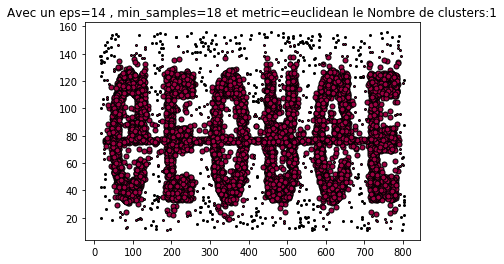

Silhouette Coefficient: 0.011


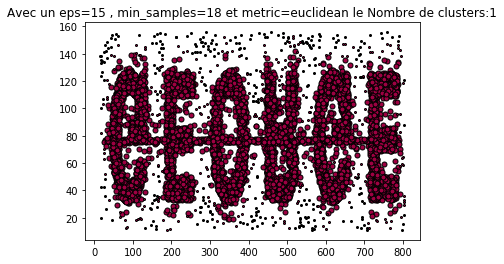

Silhouette Coefficient: 0.024


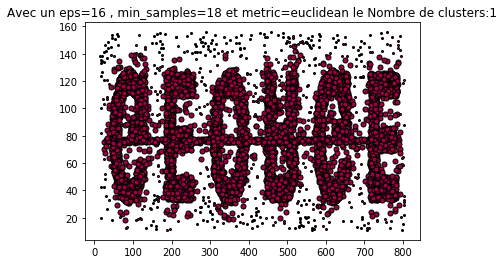

Silhouette Coefficient: 0.051


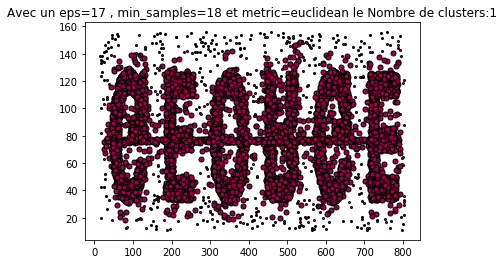

Silhouette Coefficient: 0.086


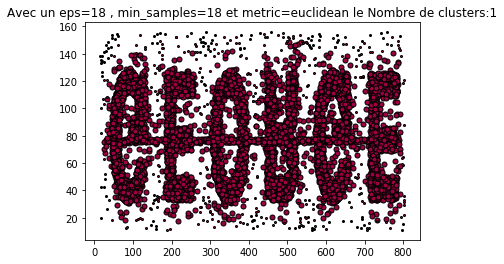

Silhouette Coefficient: -0.055


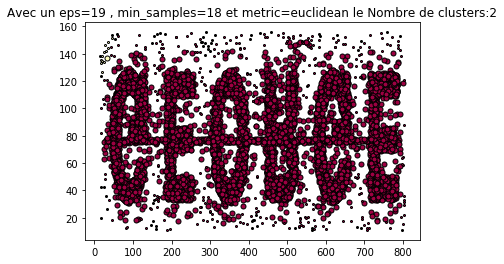

Silhouette Coefficient: 0.010


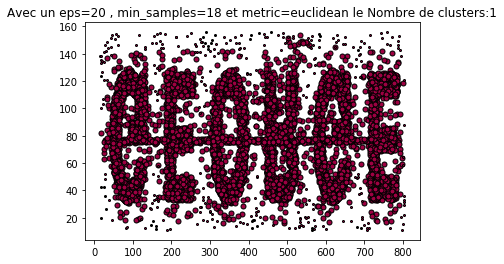

Silhouette Coefficient: 0.021


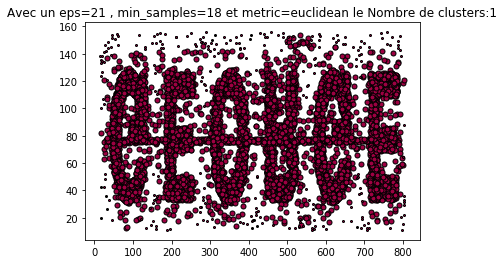

Silhouette Coefficient: 0.077


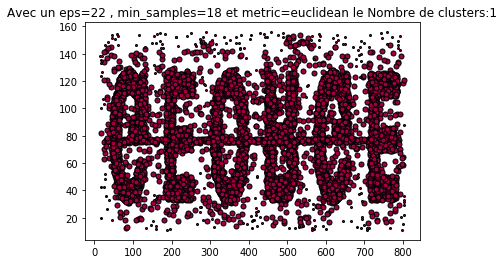

Silhouette Coefficient: 0.145


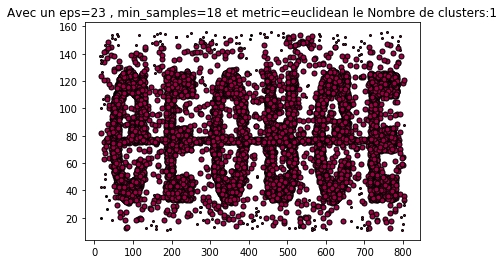

Silhouette Coefficient: 0.068


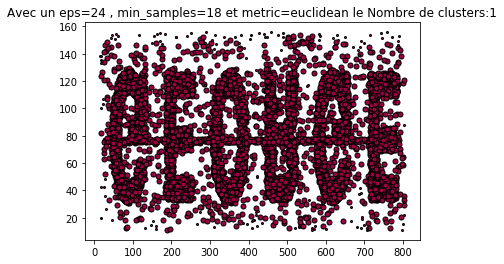

In [9]:
Scores_2 = []
data_2 = np.genfromtxt("cham-data/t5.8k.dat",delimiter=" ")
for i in range(5,25):
    meth_dbscan(dataSet=data_2,distance=i,Scores = Scores_2)

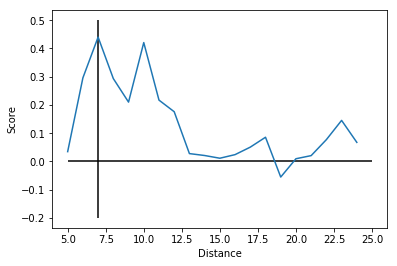

In [10]:
plt.plot(range(5,25),Scores_2)
plt.hlines(y=0,xmin=5, xmax=25)
plt.vlines(x=7,ymin=-0.2,ymax=0.5)
plt.xlabel('Distance')
plt.ylabel('Score')
plt.show()

Silhouette Coefficient: -0.594


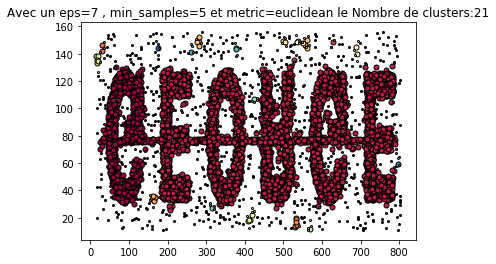

Silhouette Coefficient: -0.361


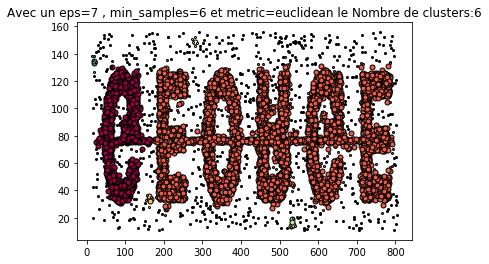

Silhouette Coefficient: -0.398


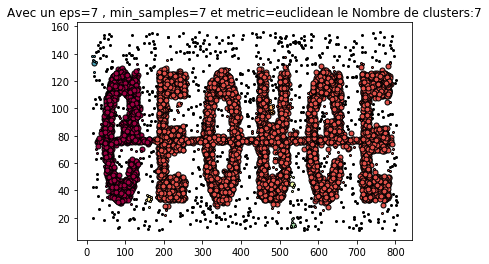

Silhouette Coefficient: 0.004


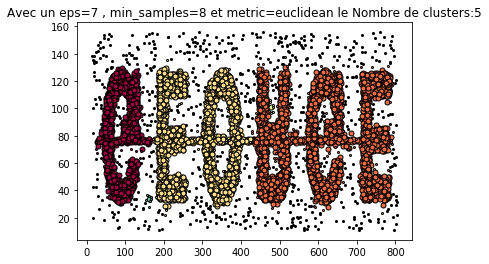

Silhouette Coefficient: 0.122


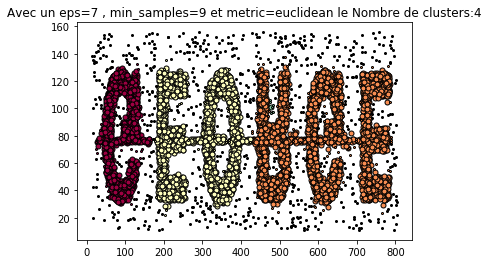

Silhouette Coefficient: 0.171


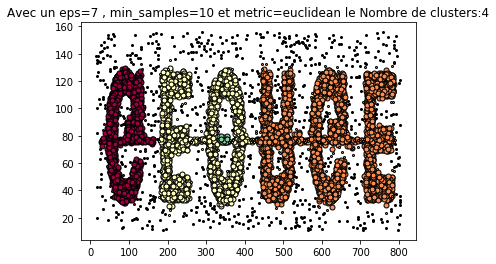

Silhouette Coefficient: 0.198


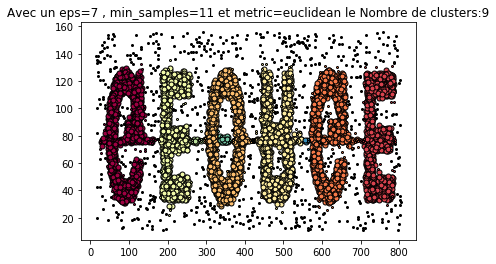

Silhouette Coefficient: 0.110


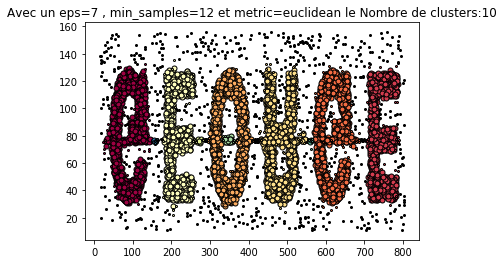

Silhouette Coefficient: 0.090


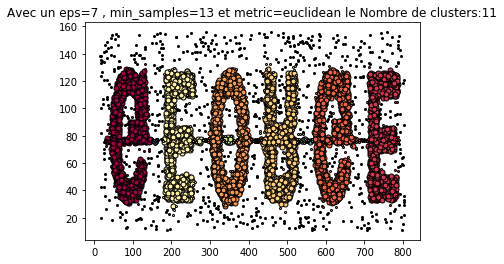

Silhouette Coefficient: 0.193


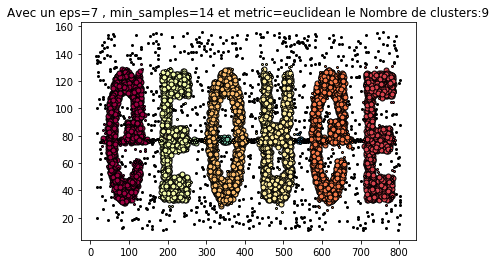

Silhouette Coefficient: 0.289


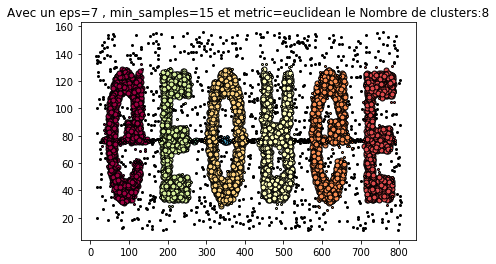

Silhouette Coefficient: 0.281


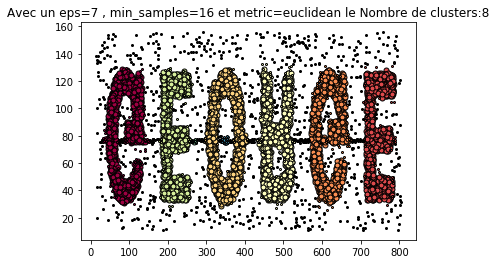

Silhouette Coefficient: 0.327


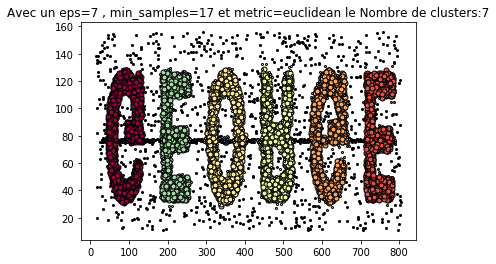

Silhouette Coefficient: 0.440


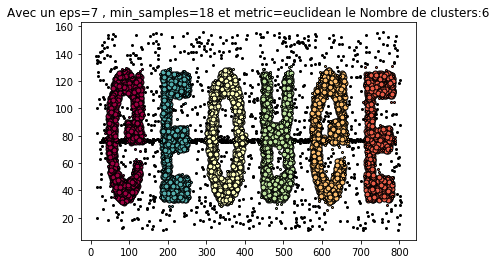

Silhouette Coefficient: 0.438


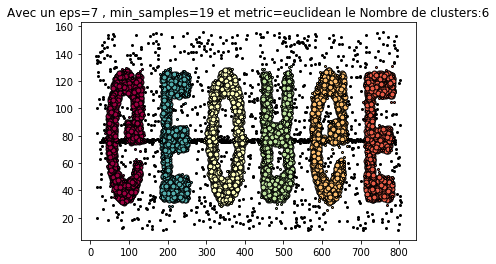

Silhouette Coefficient: 0.436


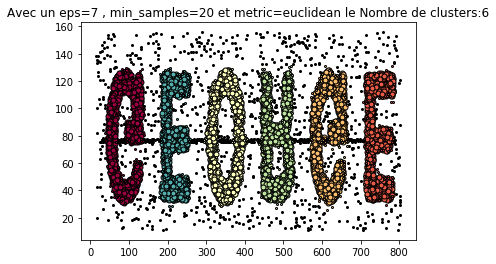

Silhouette Coefficient: 0.307


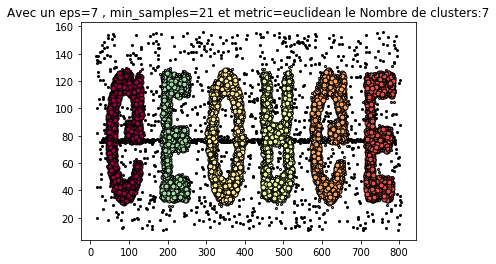

Silhouette Coefficient: 0.430


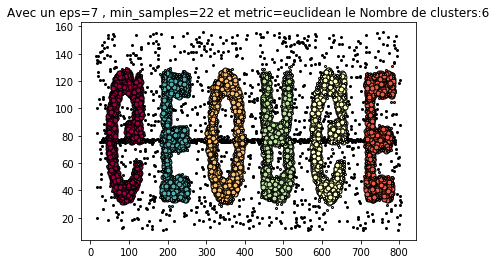

Silhouette Coefficient: 0.428


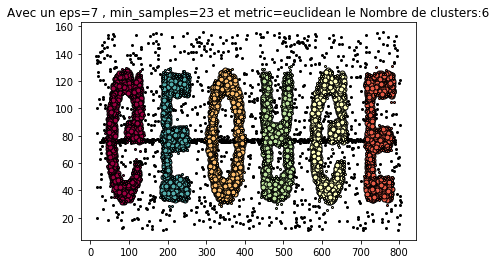

Silhouette Coefficient: 0.424


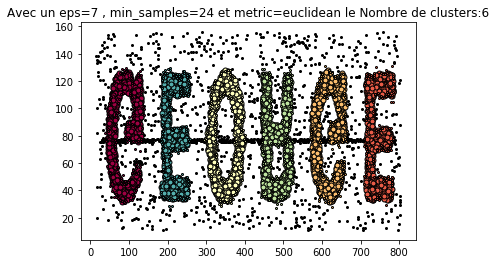

In [11]:
ScoresSamples_2 = []
data_2 = np.genfromtxt("cham-data/t5.8k.dat",delimiter=" ")
for i in range(5,25):
    meth_dbscan(dataSet=data_2,minSamples=i,distance=7,Scores = ScoresSamples_2)

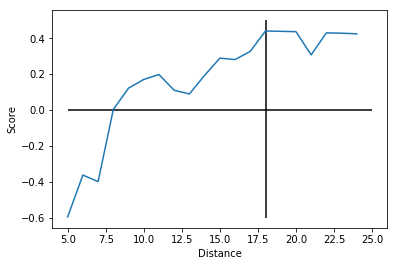

In [12]:
plt.plot(range(5,25),ScoresSamples_2)
plt.hlines(y=0,xmin=5, xmax=25)
plt.vlines(x=18,ymin=-0.6,ymax=0.5)
plt.xlabel('Distance')
plt.ylabel('Score')
plt.show()

Silhouette Coefficient: 0.440


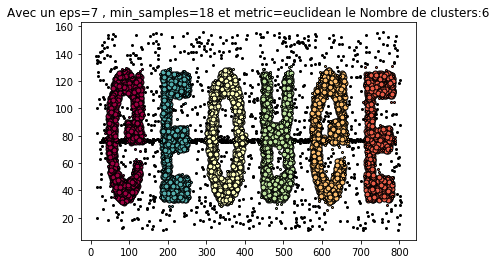

In [13]:
meth_dbscan(dataSet=data_2,minSamples=18,distance=7,Scores = ScoresSamples)

## Partie SNN

On import les données et ensuite on crée notre matrice des plus proches voisins qui contient des 0 et 1

### Méthode 1

In [4]:
from scipy.spatial.distance import pdist,squareform
from sklearn.neighbors import NearestNeighbors

data_2 = np.genfromtxt("cham-data/t4.8k.dat",delimiter=" ")

res=np.array(squareform(pdist(data_2, metric='euclidean')))

res = (1/(1+res))

res_data = res.copy()

idx = np.argpartition(res, kth=5)

for i in range(len(res)):
    res[i,idx[i][:5]] = 1
    res[i,idx[i][5:]] = 0
    

In [5]:
res2 = res
print(res2)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


Ensuite on crée la matrice qui représente le schéma de Jarvis – Patrick

In [6]:
multi = np.linalg.matrix_power(res2,2)

In [17]:
multi2 = multi.copy()
multi2 = multi2 + multi2.T
multi2[np.where(multi2 > 1)] = 1

multi2 = np.multiply((res_data),multi2)

multi2[np.where(multi2 < 0.02)] = 0

Pour un nombre de voisin 5 et un threshold 0.02 on obtient 5 cluster bien distinct

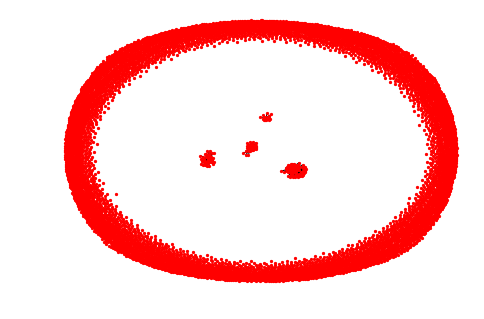

In [18]:
import networkx as nx

mulit2 = multi2[:200,:200]

G = nx.from_numpy_matrix(multi2)

nx.draw(G, node_size=5)

### Methode 2

In [1]:
import numpy as np
from numpy import linalg as la

# scikit-learn
from sklearn import datasets, metrics
from sklearn.cluster import DBSCAN
from sklearn.neighbors import kneighbors_graph, NearestNeighbors

# scipy
from scipy.spatial.distance import pdist,squareform
from scipy.sparse import csgraph as csg

# plot
import matplotlib.pyplot as plt
import networkx as nx
from networkx.drawing.nx_pydot import write_dot # Write to file

In [2]:
dataset = np.loadtxt('cham-data/t4.8k.dat')

Paramètre

In [3]:
X = dataset
k = 10
threshold_percentage = 0.4 # min = 0, max = 1
symmetric = True
n_clusters = 100
noise_percentage = 0.05 # Percentage of linking power to be ignored

#### Construct similarity mattrix

(save in file to avoid learn time)

In [5]:
# similarity_graph = kneighbors_graph(
#     X, 
#     n_neighbors = X.shape[0] - 1,
#     mode='distance', 
#     metric='euclidean',
#      p=2) # n x n

# similarity_matrix = similarity_graph.toarray()
similarity_matrix = np.array(squareform(pdist(X, metric='euclidean')))
similarity_matrix = 1 / (1 + similarity_matrix)
np.save('similarity_matrix', similarity_matrix)

**(check point)**

In [6]:
similarity_matrix = np.load('similarity_matrix.npy')
print("similarity_matrix loaded, dimension",similarity_matrix.shape)

similarity_matrix loaded, dimension (8000, 8000)


#### Sparsify the similarity matrix using k-nn sparsification

In [7]:
neigh = NearestNeighbors(n_neighbors = k, n_jobs=-1)
neigh.fit(similarity_matrix)
k_neighbor_indices = neigh.kneighbors(return_distance = False)
np.save('k_neighbor_indices', k_neighbor_indices)

**(check point)**

In [8]:
k_neighbor_indices = np.load('k_neighbor_indices.npy')
print("k_neighbor_indices loaded, dimension",k_neighbor_indices.shape)

k_neighbor_indices loaded, dimension (8000, 10)


#### Construct the shared nearest neighbor graph from k-nn sparsified similarity matrix

In [9]:
linking_matrix = np.zeros(similarity_matrix.shape)
linking_matrix[np.arange(similarity_matrix.shape[0])[:, None], k_neighbor_indices] = 1
if symmetric :
    linking_matrix = (linking_matrix + linking_matrix.T)
    linking_matrix = linking_matrix + linking_matrix.T
    linking_matrix[ np.where(linking_matrix > 1) ] = 1 
np.save('linking_matrix', linking_matrix)

In [10]:
# Verify that we don't have 0 every where
print(np.sum(linking_matrix, axis=1))
print(np.sum(linking_matrix))

[10. 12. 10. ... 10. 11. 14.]
93796.0


**(check point)**

In [11]:
linking_matrix = np.load('linking_matrix.npy')
print("linking_matrix loaded, dimension",linking_matrix.shape)

linking_matrix loaded, dimension (8000, 8000)


#### For every point in the graph, calculate the total strength of links coming out of the point. (Steps 1-4 are identical to the Jarvis – Patrick scheme.) 

In [12]:
shared_matrix = la.matrix_power(linking_matrix, 2)
np.fill_diagonal(shared_matrix, 0)
shared_matrix = np.multiply((k + 1 - similarity_matrix), shared_matrix)
np.save('shared_matrix', shared_matrix)

**(check point)**

In [13]:
shared_matrix = np.load('shared_matrix.npy')
print("shared_matrix loaded, dimension",shared_matrix.shape)

shared_matrix loaded, dimension (8000, 8000)


#### Identify representative points by choosing the points that have high total link strength.
#### Identify noise points by choosing the points that have low total link strength and remove them. 

In [14]:
linking_power = np.sum(shared_matrix, axis=0)

noise_threshold = noise_percentage * (np.max(linking_power) - np.min(linking_power)) + np.min(linking_power)
noises = np.where(linking_power < noise_threshold)[0]

#### Remove all links that have weight smaller than a threshold. 

In [15]:
threshold = threshold_percentage * np.max(shared_matrix)
cutted_shared_matrix = shared_matrix.copy()
cutted_shared_matrix[np.where(shared_matrix < threshold)] = 0

#### Take connected components of points to form clusters, where every point in a cluster is either a representative point or is connected to a representative point

In [16]:
# Test if we have Strongly connected graph
nb_cluster, _labels = csg.connected_components(cutted_shared_matrix, directed=False)
print('Detect cluster by Strongly connected components: nb cluster = ', nb_cluster)

Detect cluster by Strongly connected components: nb cluster =  1398


In [17]:
# ignore noises:
# Caution: bewhare to affect noises when you are not sure about the noises threshold
_labels[noises] = -1

#### Debug show shared matrix

In [19]:
def show_graph(matrix):
    G = nx.from_numpy_matrix(matrix)
    nx.draw(G, node_size=10)

c:\users\moham\appdata\local\programs\python\python36\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


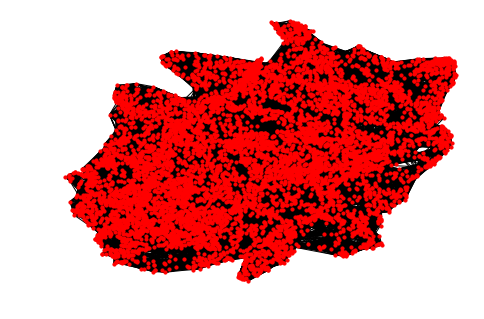

In [20]:
show_graph(shared_matrix)

#### Visualize 

In [22]:
# labels = clustering.labels_
labels = _labels
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print("Nombre de cluster:",n_clusters)

Nombre de cluster: 1373


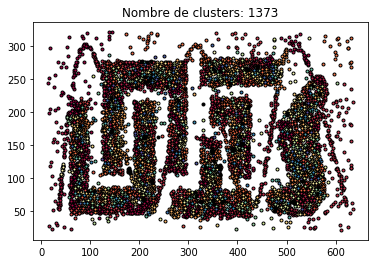

In [23]:
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
# core_samples_mask = np.zeros_like(labels, dtype=bool)
# core_samples_mask[clustering.core_sample_indices_] = True

for k, col in zip(unique_labels, colors):
    
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    # afficher les données de cluster
#     xy = dataset[class_member_mask & core_samples_mask]
    xy = dataset[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=3)

    # noises
#     xy = dataset[class_member_mask & ~core_samples_mask]
#     xy = dataset[class_member_mask]
#     plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=1)

plt.title('Nombre de clusters: %d' % n_clusters)
plt.show()

Pour la deuxième méthode on peut avoir une représentation des clusters par rapport aux données entré en revanche la méthode une nous donne seulement un visuel sur le nombre de clusters